---
title: "Exploration des données" 

jupyter: python3
format:
  html:
    
    css: style_book.css
    code-fold: true
    code-tools: true
    code-copy: true
    highlight-style: dark
    collapse-level: 2
    
    # numérotation des sections
    number-sections: true
    anchor-sections: true
    # table de matière avec une profondeur à 2
    toc: true
    toc-depth: 3
    number-depth: 3 
    toc-title: Contenu de la note
    toc-location: right
    
    embed-resources: true
    smooth-scroll: true
    grid:
      sidebar-width: 352.4px
      body-width: 1100px
      margin-width: 352.4px
      gutter-width: 1.5em
  
geometry:
  - left=.75in
  - textwidth=4.5in
  - marginparsep=.25in
  - marginparwidth=2.25in
---

## Description du jeu de données

La base de données à notre disposition contient 90 000 déclarations de sinistres `Arrêt Travail` en Australie et générés de manière synthétique. Pour chacune des observations contenu dans la base, nous avons la synthèse de 3 catégories d’informations :

- les informations contractuelles relatives au travailleur et à la nature de son contrat de travail ;
- les informations concernant la personnes intervenant dans le contrat tel que le statut matrimonial, le sexe, le nombre de personne à charge ;
- les informations textuelles décrivant la survenance du sinistre.

In [5]:
import pandas as pd
import numpy as np
from datetime import datetime as dt 
from sklearn.cluster import KMeans

#% matplotlib inline
#% matplotlib notebook  # Pour les graphiques interactifs
import matplotlib.pyplot as plt
import seaborn as sns

import os
from skimpy import skim
from pandas_profiling import ProfileReport
from sklearn.decomposition import LatentDirichletAllocation as lda
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from linkquarto.link_color import Mise_enforme

Couleur = Mise_enforme()
pallete = [Couleur.lkp_green,Couleur.lkp_blue,Couleur.lkp_magenta,Couleur.lkp_comp_blue,Couleur.lkp_grey, Couleur.lkp_purple,
           Couleur.lkp_green,Couleur.lkp_blue,Couleur.lkp_magenta,Couleur.lkp_comp_blue,Couleur.lkp_grey, Couleur.lkp_purple,
           Couleur.lkp_green,Couleur.lkp_blue,Couleur.lkp_magenta,Couleur.lkp_comp_blue,Couleur.lkp_grey, Couleur.lkp_purple]
pal = sns.color_palette(pallete, len(pallete))



FORMAT_DATE = "%Y-%m-%dT%H:%M:%SZ"

def bar_bivariee(x, y, xlab, ylab, titre, Couleurs,nb):
    """
    Cette fonction affiche un diagramme en bare bivarié
    params:
        x : la l'absice à afficher
        y : la colonne à afficher
        xlab : label abscice
        ylab : label ordonnée
        titre : le title
    """

    graf = sns.barplot(x = x, y= y,  palette=Couleurs)
    #graf = sns.countplot(x=x,palette=pal, legend=False)
    plt.xticks(np.linspace(x.min()-x.min(), x.max()-x.min(), nb, dtype=int), np.linspace(x.min(), x.max(), nb, dtype=int), fontdict={"fontsize":"x-large", "fontfamily":"Calibri", "color":"#060341"})
    
    plt.xlabel(xlab,fontdict={"fontsize":"x-large",
                              "fontfamily":"Calibri",
                              "color":"#060341"})
    plt.ylabel(ylab,fontdict={"fontsize":"x-large", 
                              "fontfamily":"Calibri",
                              "color":"#060341"})
    plt.title(titre,fontdict={"fontsize":"x-large", 
                              "fontfamily":"Calibri",
                              "color":"#060341"})

    graf.set_xticks(graf.get_xticks())
    graf.set_xticklabels(graf.get_xticklabels(), rotation=65,  horizontalalignment='right');
    

# import bd
df = pd.read_csv("../data/train.csv")

inflation = pd.read_excel("../data/inflation_australie.xlsx")

#formatage des variables date
df["DateTimeOfAccident"] = pd.to_datetime(df.DateTimeOfAccident, format=FORMAT_DATE, errors='coerce')
df["DateReported"] = pd.to_datetime(df.DateReported, format=FORMAT_DATE, errors='coerce')
df["AnneAccident"] = df.DateTimeOfAccident.dt.year

# info sur la bd
skim(df);

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 54000  │ │ int32       │ 6     │                                                          │
│ │ Number of columns │ 16     │ │ string      │ 5     │                                                          │
│ └───────────────────┴────────┘ │ float64     │ 3     │                                                          │
│                                │ datetime64  │ 2     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name           ┃ NA  ┃ NA %  ┃ mean      ┃ sd     ┃ p0    ┃ p25   ┃ p50   ┃ p75  ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ Age                   │   0 │     0 │     33.84 │  12.12 │    13 │    23 │    32 │   43 │      81 │ ▇▇▆▃▁  │  │
│ │ DependentChildren     │   0 │     0 │    0.1192 │ 0.5178 │     0 │     0 │     0 │    0 │       9 │   ▇    │  │
│ │ DependentsOther       │   0 │     0 │  0.009944 │ 0.1093 │     0 │     0 │     0 │    0 │       5 │   ▇    │  │
│ │ WeeklyWages           │   0 │     0 │     416.4 │  248.6 │     1 │   200 │ 392.2 │  500 │    7497 │   ▇    │  │
│ │ HoursWorkedPerWeek    │   0 │     0 │     37.74 │  12.57 │     0 │    38 │    38 │   40 │     640 │   ▇    │  │
│ │ DaysWorkedPerWeek     │   0 │     0 │     4.906 │ 0.5521 │     1 │     5 │     5 │    5 │       7 │     ▇  │  │
│ │ InitialIncurredCalims │   0 │     0 │      7841 │  20580 │     1 │   700 │  2000 │ 9500 │ 2000000 │   ▇    │  │
│ │ Cost                  │     │       │           │        │       │       │       │      │         │        │  │
│ │ UltimateIncurredClaim │   0 │     0 │     11000 │  33390 │ 121.9 │ 926.3 │  3371 │ 8197 │ 4027000 │   ▇    │  │
│ │ Cost                  │     │       │           │        │       │       │       │      │         │        │  │
│ │ AnneAccident          │   0 │     0 │      1997 │  5.188 │  1988 │  1992 │  1997 │ 2001 │    2005 │ ▇▇▇▇▇▇ │  │
│ └───────────────────────┴─────┴───────┴───────────┴────────┴───────┴───────┴───────┴──────┴─────────┴────────┘  │
│                                                    datetime                                                     │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓  │
│ ┃ column_name             ┃ NA  ┃ NA %   ┃ first                    ┃ last                     ┃ frequency   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩  │
│ │ DateTimeOfAccident      │   0 │      0 │   1988-01-01 09:00:00    │   2005-12-31 10:00:00    │ None        │  │
│ │ DateReported            │   0 │      0 │        1988-01-08        │        2006-09-23        │ None        │  │
│ └─────────────────────────┴─────┴────────┴──────────────────────────┴──────────────────────────┴─────────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━

## Qualité des données

Hormis de la variable `MaritalStatus` renseignant sur le statut matrimonial  avec 5\% de données manquantes, les variables sont bien remplies.

- Nous avons dans la base des travailleurs de plus de 75 ans, ce qui est pour le moins atypique.
- Les sinistres de notre base concernent les survenances de 1988 à 2005. 
- Le portefeuille est majoritairement jeune, avec un âge médian de 32 ans. 
- Les sinistrés n'ont globalement pas de personne à charge, nous pouvons "binariser" cette information. 
- En moyenne, l'assureur estime le coût initial du sinistre à 7776, avec un coût médian de 2000. 
- Le salaire hebdomadaire médian de chaque sinistré est de 393.3.

### Analyse en cascade des données

In [6]:
ProfileReport(df) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Correction des données
La variable `Gender` renseignant sur le sexe a des observations où le sexe est inconnu : nous les remplaçons par le mode.

La variable `MaritalStatus` renseignant sur le statut matrimonial a une proportion non-négligeable de valeurs inconnues : nous la laissons en l'état, car elle peut représenter une catégorie non prise en compte comme les concubins ou les pacsés. 

Nous avons "binarisé" la présence de personne dépendante à la charge du sinistré.

Nous avons également borné le nombre d'enfants à 4 au vu du faible nombre de valeur au-delà.

La variable `HoursWorkedPerWeek` renseignant sur le nombre d'heures de travail par semaine a des valeurs aberrantes. Selon le site https://www.studyrama.com/, légalement, le temps de travail hebdomadaire en Australie est fixé à 40 heures par semaine. En pratique, il varie entre 35 et 40 heures (le plus souvent 38 heures) selon les contrats. Au-delà des heures légales, les heures supplémentaires sont comptées 50 % plus chères. Par contre, il n'y a pas en Australie de limite maximale spécifique pour les heures supplémentaires. Nous fixons arbitrairement le nombre d'heures supplémentaires à 20 heures par semaine et corrigeons les données.

Nous remplaçons les salaires hebdomadaires de moins de 5 par la médian et l'estimation initiale de moins de 50 par la médiane.


In [7]:
# df.loc[df.DateTimeOfAccident>df.DateReported,] # pas de date abérante
df.loc[df.Gender=="U","Gender"] = "M"
df["MaritalStatus"] = df.MaritalStatus.fillna("S")
df.loc[df.DependentsOther>1, "DependentsOther"] =1 # binarisation de la présence de personne dependante
df.loc[df.DependentChildren>3, "DependentChildren"] = 4 # bornage du nombre d'enfant

df.loc[df.HoursWorkedPerWeek>60,"HoursWorkedPerWeek"] = -1 # valeurs abérantes
 
df.loc[df.Age>75,"Age"] = 75 # transparent lors de la création de classe d'age plutard

df.loc[df.InitialIncurredCalimsCost <= 50,'InitialIncurredCalimsCost'] = df.InitialIncurredCalimsCost.mode()[0]
df.loc[df.WeeklyWages.astype(int) < 5,'WeeklyWages'] = df.WeeklyWages.mode()[0]

## Prise en compte de l'inflation et enrichissement de la base

Pour prendre en compte l'inflation dans le coût des sinistres d'une année à l'autre, il est important d'ajuster les coûts des sinistres à une valeur constante pour que les comparaisons soient pertinentes. Ainsi, pour une année de référence t_0, le coût ajusté du sinistre est défini par :

$Coût\_ajt_t = Coût_t*\frac{IPC_{t_0}}{IPC_{t}}$, où $IPC_t = IPC_{t-1}*(1+ taux\_inflation)$.

Le graphique ci-dessous présente l'évolution de l'inflation en Australie pour les 75 dernières années.


 ![](inflation.png)


 Nous représentons ensuite l'évolution du coût moyen de sinistre avant la prise en compte de l'inflation et après la prise en compte de l'inflation.

C:\Users\Guy NYAMSI\AppData\Local\Temp\ipykernel_21108\543730645.py:8: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  inflation.IPC[i] = inflation.Inflation_Australie[i]
C:\Users\Guy NYAMSI\AppData\Local\Temp\ipykernel_21108\543730645.py:8: S

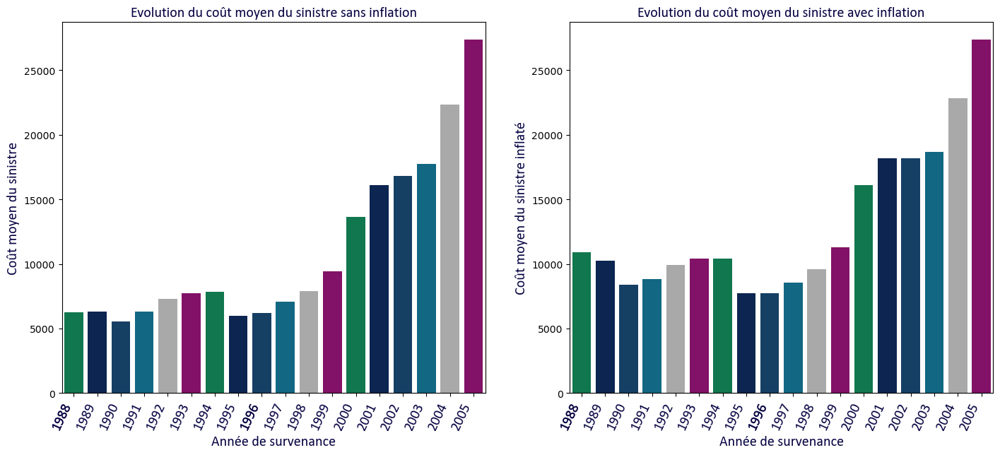

In [8]:
inflation.sort_values(by="Annee", inplace=True, ascending=False)
inflation = inflation.loc[(inflation.Annee>=1988)&(inflation.Annee<=2005)]
inflation.reset_index(inplace=True, drop=True)
inflation["IPC"] = 0

for i in range(inflation.shape[0]):
    if i == 0:
        inflation.IPC[i] = inflation.Inflation_Australie[i]
    else:
        inflation.IPC[i] = inflation.IPC[i-1]*(1+inflation.Inflation_Australie[i])
        
#train = train.drop(["ClaimNumber", "DateReported"], axis=1)

df = df.merge(inflation, left_on='AnneAccident', right_on='Annee')
IPC_0 = 0.0269
df["ClaimInflate"] = df.UltimateIncurredClaimCost*(df.IPC/IPC_0)
df["InitialClaimInflate"] = df.InitialIncurredCalimsCost*(df.IPC/IPC_0)
data_sans_inf = df[["AnneAccident", "UltimateIncurredClaimCost"]].groupby("AnneAccident").mean().reset_index()
data_avec_inf = df[["AnneAccident", "ClaimInflate"]].groupby("AnneAccident").mean().reset_index()


df['MoisAccident'] = df.DateTimeOfAccident.dt.month
df['JourAccident'] = df.DateTimeOfAccident.dt.day 
df['WeekAccident'] = df.DateTimeOfAccident.dt.day_name()
df['DelaiDeclaJour'] = np.where(df.DateReported > df.DateTimeOfAccident,(df.DateReported - df.DateTimeOfAccident).dt.days, 0)
df['DelaiDeclaAn'] = np.where(df.DateReported > df.DateTimeOfAccident,(df.DateReported - df.DateTimeOfAccident).dt.days/365.25, 0)

#df["ClaimInflate"] = np.log(df.ClaimInflate+1)
#df["InitialClaimInflate"] = np.log(df.InitialClaimInflate+1)

%matplotlib inline
fig = plt.figure(figsize=(17,15))
plt.subplot(221)

bar_bivariee(data_sans_inf.AnneAccident,
              data_sans_inf.UltimateIncurredClaimCost, 
              "Année de survenance", 
              "Coût moyen du sinistre", 
              "Evolution du coût moyen du sinistre sans inflation", 
              pal,
              20)
plt.subplot(222)

bar_bivariee(data_avec_inf.AnneAccident,
              data_avec_inf.ClaimInflate, 
              "Année de survenance", 
              "Coût moyen du sinistre inflaté", 
              "Evolution du coût moyen du sinistre avec inflation", 
              pal,
              20);

## Analyse de la description des sinistres.

A partir du texte non structuré issue de la description du sinistre, nous allons utiliser la modélisation automatique de sujet permettant de détecter les sujets latents abordé dans un corpus de documents pour ensuite assigner les sujets détecté à ces corpus de documents : c'est donc de l'apprentissage non-supervisé permettant de créer des catégories de sujets. La méthode LDA (Latent Dirichlet Allocation) est la plus ancienne et la plus populaire. 

C:\Users\Guy NYAMSI\AppData\Local\Temp\ipykernel_21108\3587104603.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  graf = sns.countplot(df.DescriptionGroup, palette=pal)
C:\Users\Guy NYAMSI\AppData\Local\Temp\ipykernel_21108\3587104603.py:41: UserWarning: 
The palette list has fewer values (18) than needed (20) and will cycle, which may produce an uninterpretable plot.
  graf = sns.countplot(df.DescriptionGroup, palette=pal)


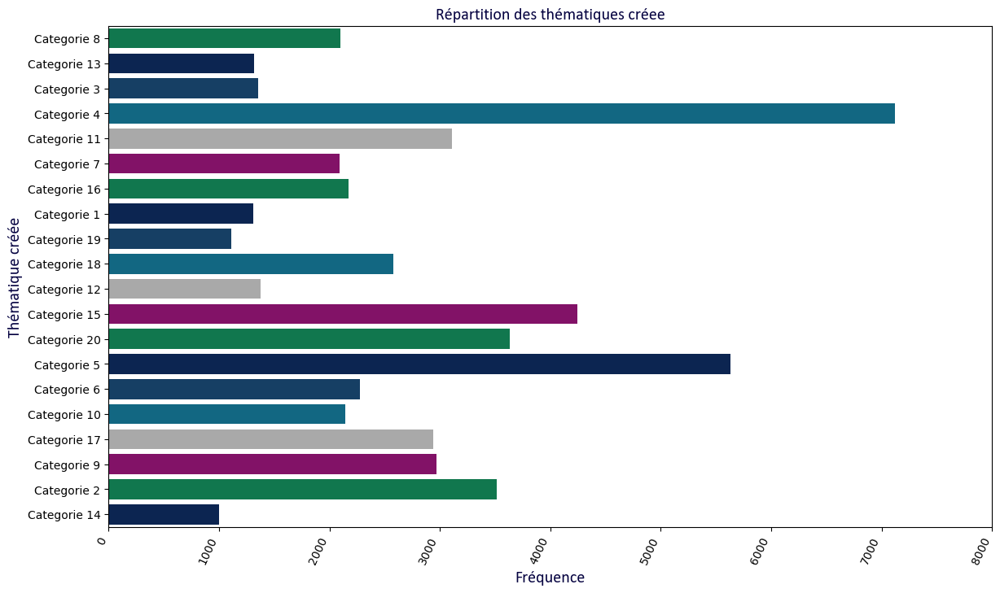

In [9]:
# mots les plus fréquents issue du Count word

documents = [mots.lower() for mots in df.ClaimDescription.to_list()]

n_theme = 20
nb_features = 1000
freq_mot = CountVectorizer(max_df=0.95, 
                           min_df=2, 
                           max_features=nb_features, 
                           stop_words=["right", "left", "back", "strain", "english"]) # mots les plus fréquents issue du Count word
freq_mots = freq_mot.fit_transform(documents)



# Créer le modèle LDA
lda_model = lda(
        n_components=n_theme, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=0)

lda_model.fit(freq_mots)

def display_topics(model, feature_names, no_top_words):

    for topic_idx, topic in enumerate(model.components_):
        print("Topic {}:".format(topic_idx))
        print(" ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

# Transformation des documents pour obtenir la matrice des sujets
topic_matrix = lda_model.transform(freq_mots)

# Associer chaque document au sujet avec le coefficient le plus élevé
document_topic = np.argmax(topic_matrix, axis=1)

df['DescriptionGroup'] = ["Categorie {}".format(topic+1) for topic in document_topic]

%matplotlib inline
fig = plt.figure(figsize=(14,8))
graf = sns.countplot(df.DescriptionGroup, palette=pal)
plt.xlabel("Fréquence",fontdict={"fontsize":"x-large",
                            "fontfamily":"Calibri",
                            "color":"#060341"})
plt.ylabel("Thématique créée",fontdict={"fontsize":"x-large", 
                            "fontfamily":"Calibri",
                            "color":"#060341"})
plt.title("Répartition des thématiques créee",fontdict={"fontsize":"x-large", 
                            "fontfamily":"Calibri",
                            "color":"#060341"})

graf.set_xticks(graf.get_xticks())
graf.set_xticklabels(graf.get_xticklabels(), rotation=65,  horizontalalignment='right');



Après correction des données et prise en compte de l'inflation, nous obtenons la nouvelle analyse en cascade ci-dessous. 

In [10]:
df_clean = df.drop(["Annee", 
                    "DateReported", 
                    "DateTimeOfAccident", 
                    "ClaimNumber", 
                    "ClaimDescription", 
                    "IPC", 
                    "Inflation_Australie", 
                    "UltimateIncurredClaimCost", 
                    "InitialIncurredCalimsCost"], axis=1)
ProfileReport(df_clean) 

# sns.heatmap(df_num.corr(),
#             cmap = pal,
#             annot = True);

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Sélection des données 
Nous testerons des modèles de régressions plus tard. En cet effet, nous étudions la corrélation des variables numériques.

 ![](correlation.png)

Il ressort du graphique ci-dessus que les variables `DaysWorkedPerWeek` et `HoursWorkedPerWeek` sont fortement corrélées, mais elle ne dépasse pas le seuil de 0.8 que nous nous fixons. Donc, nous n'avons pas de problème de multi-colinéarité dans nos données.

Il est d'usage en modélisation de la sinistralité de séparer les sinistres graves des sinistres attritionelles. 
Pour ce fait, nous définissons un seuil de sinistralité avec la méthode des Kmeans (technique d'apprentissage non supervisé utilisée pour la partition des données en k groupes ou clusters) afin de séparer les sinistres graves des sinistres attritionelles.
Nous obtenons cette répartition ci-dessous.

In [11]:
# Reshape des données pour KMeans
couts = np.array(df_clean['InitialClaimInflate']).reshape(-1, 1)

# KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0).fit(couts)

# Définir le seuil basé sur les centres des clusters
threshold = kmeans.cluster_centers_.mean()
#print(f"Seuil basé sur clustering: {threshold}")

# Définir le seuil basé sur le 90e percentile
#df_clean['InitialClaimInflate'].quantile(0.90)
# Catégorisation des sinistres
df_clean['TypeSinistre'] = df_clean['InitialClaimInflate'].apply(lambda x: 'Grave' if x > threshold else 'Attritionnelle')

df_cleans = df_clean.loc[df_clean.TypeSinistre =="Attritionnelle"]
df_cleans.reset_index(inplace=True, drop=True);
df_cleans = df_cleans.drop(["TypeSinistre"], axis=1)

pd.pivot_table(df_clean, values='InitialClaimInflate',  index='TypeSinistre', aggfunc=["count", "min", "mean", "median", "max"])


# sauvegarde de la base traitée

df.to_csv(os.path.join("../data/df.csv"), sep=";", index =False)
df_clean.to_csv(os.path.join("../data/df_clean.csv"), sep=";", index =False)
df_cleans.to_csv(os.path.join("../data/df_cleans.csv"), sep=";", index =False)
